# Amazon customers' Data Analysis Project

***-by Mainak Ghosh***

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3
import nltk
import string

**Connecting the SQL File to the python notebook**

In [2]:
con=sqlite3.connect(r'C:\Users\lenovo\Downloads\Amazon\database.sqlite') 

In [3]:
type(con)

sqlite3.Connection

In [4]:
df=pd.read_sql_query("SELECT * FROM Reviews ",  con)

**Sentiment analysis of the given data**

In [5]:
from textblob import TextBlob

In [6]:
TextBlob (df['Summary'][0]).sentiment.polarity

0.7

In [7]:
polarity=[]
for i in df['Summary']:
    try:
        polarity.append(TextBlob(i).sentiment.polarity)
    except:
        polarity.append(0)

In [8]:
len(polarity)

568454

In [9]:
data=df.copy()

In [10]:
data['polarity']=polarity

In [11]:
data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,polarity
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,0.7
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0.0
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,0.0
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0.0
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,0.8


In [12]:
data['polarity'].nunique()

4578

**Visualising the positives of sentiments analysis**

In [13]:
data_positive=data[data['polarity']>0]

In [14]:
from wordcloud import WordCloud, STOPWORDS

In [15]:
stopwords=set(STOPWORDS)

In [16]:
positive=data_positive[0:20000] 

In [17]:
total_text=(' '.join(data_positive['Summary']))

In [18]:
total_text[0:10000]

'Good Quality Dog Food Great taffy Nice Taffy Great!  Just as good as the expensive brands! Wonderful, tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this "diet" food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy! Love it! GREAT SWEET CANDY! Always fresh Delicious product! Great Bargain for the Price The Best Hot Sauce in the World Great machine! Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry! satisfying Love Gluten Free Oatmeal!!! GOOD WAY TO START THE DAY.... Wife\'s favorite Breakfast Why wouldn\'t you buy oatmeal from Mcanns? Tastes great! Good Hot Breakfast Great taste and convenience good Very good but next time I won\'t order the Variety Pack HOT!  And good!  Came back for more  :) Roasts up a smooth brew Our guests love it! Awesome Deal! Awsome - Kids in neighborhood loved us! great deal. Better price for this at Target great source of electrolytes Great for preventing cramps T

In [19]:
import re
total_text=re.sub('[^a-zA-Z]',' ',total_text)

In [20]:
total_text=re.sub(' +',' ',total_text)

In [21]:
total_text

'Good Quality Dog Food Great taffy Nice Taffy Great Just as good as the expensive brands Wonderful tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this diet food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy Love it GREAT SWEET CANDY Always fresh Delicious product Great Bargain for the Price The Best Hot Sauce in the World Great machine Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry satisfying Love Gluten Free Oatmeal GOOD WAY TO START THE DAY Wife s favorite Breakfast Why wouldn t you buy oatmeal from Mcanns Tastes great Good Hot Breakfast Great taste and convenience good Very good but next time I won t order the Variety Pack HOT And good Came back for more Roasts up a smooth brew Our guests love it Awesome Deal Awsome Kids in neighborhood loved us great deal Better price for this at Target great source of electrolytes Great for preventing cramps Taste is not so good How much would you

(-0.5, 999.5, 499.5, -0.5)

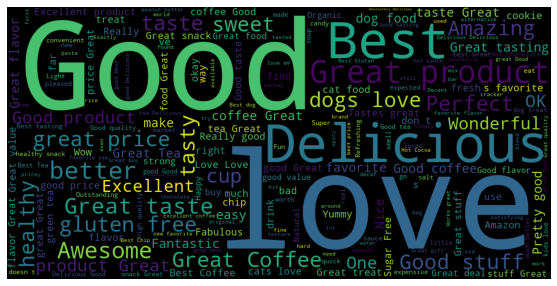

In [22]:
wordcloud = WordCloud(width = 1000, height = 500,stopwords=stopwords).generate(total_text)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

**Visualising the negatives of sentiments analysis**

In [23]:
data_negative=data[data['polarity']<0]

In [24]:
negative=data_negative[0:20000] 

In [25]:
total_text2=' '.join(data_negative['Summary'])

In [26]:
import re
total_text2=re.sub('[^a-zA-Z]',' ',total_text2)

total_text2=re.sub(' +',' ',total_text2)

(-0.5, 999.5, 499.5, -0.5)

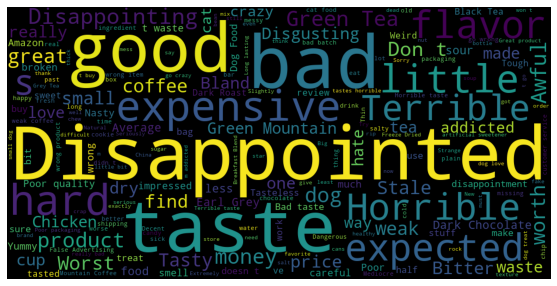

In [27]:
wordcloud = WordCloud(width = 1000, height = 500,stopwords=stopwords).generate(total_text2)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

**Finding out the most loyal customers to the brand**

In [28]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [29]:
df['UserId'].shape

(568454,)

In [30]:
raw=df.groupby(['UserId']).agg({'Summary':'count', 'Text':'count','Score':'mean','ProductId':'count'}).sort_values(by='Text',ascending=False)
raw

,Summary,Text,Score,ProductId
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [31]:
raw.columns=['Number_of_summaries','num_text','Avg_score','Number_of_products_purchased']
raw

,Number_of_summaries,num_text,Avg_score,Number_of_products_purchased
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

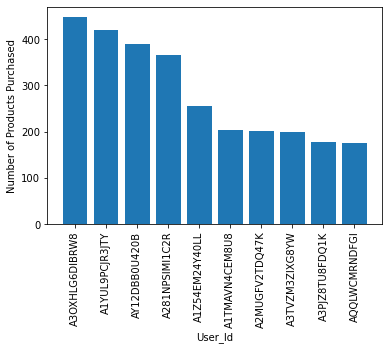

In [32]:
user_10=raw.index[0:10]
number_10=raw['Number_of_products_purchased'][0:10]

plt.bar(user_10, number_10, label='java developer')
plt.xlabel('User_Id')
plt.ylabel('Number of Products Purchased')
plt.xticks(rotation='vertical')

***These are the most suitable customers for greater discount***

**Chosing a random sample and analysing the customer review details**

In [33]:
final=df.sample(n=2000)

In [34]:
final=df[0:2000]

In [35]:
final.duplicated().sum()

0

In [36]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [37]:
def calc_len(text):
    return (len(text.split(' ')))

In [38]:
calc_len("ABCSDE ASD")

2

In [39]:
final['Text_length']=final['Text'].apply(calc_len)

<ipython-input-39-a7a52d29ef9c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final['Text_length']=final['Text'].apply(calc_len)


In [40]:
import plotly.express as px
px.box(final, y="Text_length")

***Analysing the ratings shared by customers***

C:\Users\lenovo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Score', ylabel='count'>

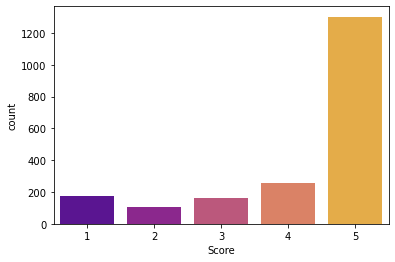

In [41]:
sns.countplot(final['Score'], palette="plasma")

***DATA CLEANSING FOR CUSTOMER ANALYSIS***

In [60]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price. there was a wid...,30


*Chaning the case to lowercase for consistency*

In [65]:
final['Text']=final['Text'].str.lower()

<ipython-input-65-98d1fdb02b21>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [77]:
final['Text'][35]

"mccann's instant irish oatmeal, variety pack of regular, apples & cinnamon, and maple & brown sugar, 10-count boxes (pack of 6)<br /><br />i'm a fan of the mccann's steel-cut oats, so i thought i'd give the instant variety a try. i found it to be a hardy meal, not too sweet, and great for folks like me (post-bariatric surgery) who need food that is palatable, easily digestible, with fiber but won't make you bloat."

*Removing punctuations*

In [78]:
import re
re.sub('[^0-9a-zA-Z]', ' ',final['Text'][35])

'mccann s instant irish oatmeal  variety pack of regular  apples   cinnamon  and maple   brown sugar  10 count boxes  pack of 6  br    br   i m a fan of the mccann s steel cut oats  so i thought i d give the instant variety a try  i found it to be a hardy meal  not too sweet  and great for folks like me  post bariatric surgery  who need food that is palatable  easily digestible  with fiber but won t make you bloat '

In [90]:
p=string.punctuation
p

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [80]:
punctuations =string.punctuation
def remove_punc(review):
    # remove punctuation from the string
    no_punct = ""
    for char in review:
        if char not in punctuations:
            no_punct = no_punct + char
    return no_punct

In [81]:
final['Text']=final['Text'].apply(remove_punc)

<ipython-input-81-0eb99769bf5d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [84]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide...,30


*Removing stopwords*

In [86]:
final['Text'][32]

'mccanns instant oatmeal is great if you must have your oatmeal but can only scrape together two or three minutes to prepare it there is no escaping the fact however that even the best instant oatmeal is nowhere near as good as even a store brand of oatmeal requiring stovetop preparation  still the mccanns is as good as it gets for instant oatmeal its even better than the organic allnatural brands i have tried  all the varieties in the mccanns variety pack taste good  it can be prepared in the microwave or by adding boiling water so it is convenient in the extreme when time is an issuebr br mccanns use of actual cane sugar instead of high fructose corn syrup helped me decide to buy this product  real sugar tastes better and is not as harmful as the other stuff one thing i do not like though is mccanns use of thickeners  oats plus water plus heat should make a creamy tasty oatmeal without the need for guar gum but this is a convenience product  maybe the guar gum is why after sitting in

In [99]:
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [101]:
re=[word for word in review.split(' ') if word not in set(stopwords.words('english'))]
str=''
for wd in re:
    str=str+wd
    str=str+' '
str

'bought husband currently overseas. loves these, apparently staff likes also.<br />there generous amounts twizzlers 16-ounce bag, well worth price. <a href="http://www.amazon.com/gp/product/b001gvisjm">twizzlers, strawberry, 16-ounce bags (pack 6)</a> '

In [103]:
def remove_stopwords(review):
    return ' '.join([word for word in review.split(' ') if word not in set(stopwords.words('english'))])

In [104]:
final['Text']=final['Text'].apply(remove_stopwords)

<ipython-input-104-423ab3727371>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [105]:
remove_stopwords(review)

'bought husband currently overseas. loves these, apparently staff likes also.<br />there generous amounts twizzlers 16-ounce bag, well worth price. <a href="http://www.amazon.com/gp/product/b001gvisjm">twizzlers, strawberry, 16-ounce bags (pack 6)</a>'

In [111]:
final['Text'][32]
             

'mccanns instant oatmeal great must oatmeal scrape together two three minutes prepare escaping fact however even best instant oatmeal nowhere near good even store brand oatmeal requiring stovetop preparation  still mccanns good gets instant oatmeal even better organic allnatural brands tried  varieties mccanns variety pack taste good  prepared microwave adding boiling water convenient extreme time issuebr br mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product  real sugar tastes better harmful stuff one thing like though mccanns use thickeners  oats plus water plus heat make creamy tasty oatmeal without need guar gum convenience product  maybe guar gum sitting bowl instant mccanns becomes thick gluey'

In [114]:
review=final['Text'][32]
review

'mccanns instant oatmeal great must oatmeal scrape together two three minutes prepare escaping fact however even best instant oatmeal nowhere near good even store brand oatmeal requiring stovetop preparation  still mccanns good gets instant oatmeal even better organic allnatural brands tried  varieties mccanns variety pack taste good  prepared microwave adding boiling water convenient extreme time issuebr br mccanns use actual cane sugar instead high fructose corn syrup helped decide buy product  real sugar tastes better harmful stuff one thing like though mccanns use thickeners  oats plus water plus heat make creamy tasty oatmeal without need guar gum convenience product  maybe guar gum sitting bowl instant mccanns becomes thick gluey'

*Removing URLs or Links*

In [115]:
final['Text'].str.contains('http?').sum()


35

In [117]:
review=final['Text'][21]
review

'bought husband currently overseas loves apparently staff likes alsobr generous amounts twizzlers 16ounce bag well worth price httpwwwamazoncomgpproductb001gvisjmtwizzlers strawberry 16ounce bags pack 6a'

In [118]:
import re
url_pattern = re.compile(r'href|http.\w+')
url_pattern.sub(r'', review)

'bought husband currently overseas loves apparently staff likes alsobr generous amounts twizzlers 16ounce bag well worth price  strawberry 16ounce bags pack 6a'

In [119]:
#import re
def remove_urls(review):
    url_pattern = re.compile(r'href|http.\w+')
    return url_pattern.sub(r'', review)

In [120]:
final['Text'] = final['Text'].apply(remove_urls)

<ipython-input-120-17d456a12363>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [121]:
final['Text'].str.contains('http?').sum()

0

In [122]:
for i in range(len(final['Text'])):
    final['Text'][i]=final['Text'][i].replace('br','')

<ipython-input-122-a85a8bfa1aaf>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lenovo\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3437: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [125]:
data2=final.copy()

In [129]:
comment_words = ' '.join(final['Text'])
stopwords= set(STOPWORDS)

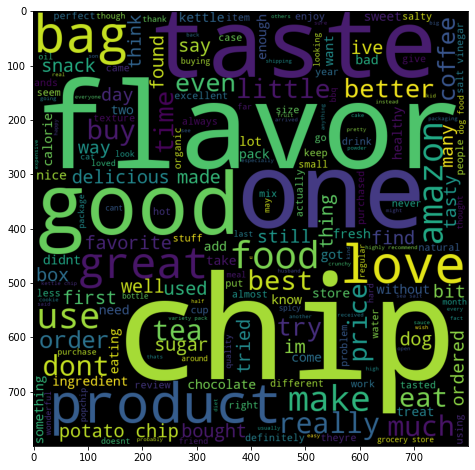

In [135]:
wordcloud = WordCloud(width = 800, height = 800, stopwords = stopwords).generate(comment_words) 
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)            

***The Final WordClouds shows the words customers are most likely to use and hence analyzes customer behaviour***